In [34]:
%matplotlib inline
import librosa
import os
import sklearn
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd

### Musical Genre Classification of Audio Signals
https://pdfs.semanticscholar.org/4ccb/0d37c69200dc63d1f757eafb36ef4853c178.pdf

In [2]:
os.getcwd()
ROOT = '../data/'

In [3]:
audio_paths = ['diwk.mp3', 'percusion.mp3']
nps = [librosa.load(ROOT + path) for path in audio_paths]

In [4]:
ipd.Audio(ROOT + audio_paths[0])

# Waveforms

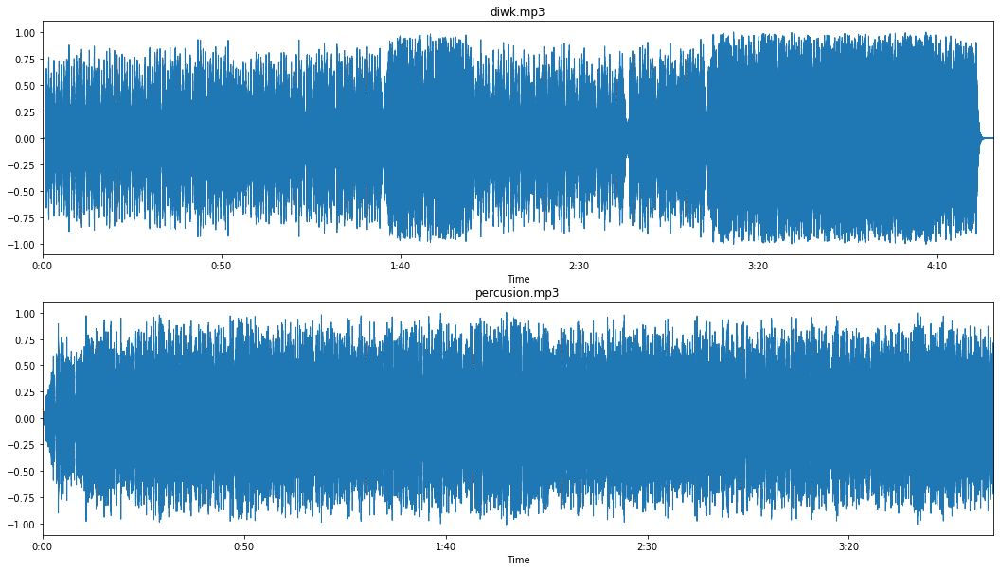

In [5]:
l = len(audio_paths)
plt.figure(figsize=(18, 10))
for i in range(l):
    plt.subplot(f'{l}1{i+1}')
    plt.title(audio_paths[i])
    x, sr = nps[i]
    librosa.display.waveplot(x, sr=sr)

## Spectrogram

A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. Spectrograms are sometimes called sonographs, voiceprints, or voicegrams. When the data is represented in a 3D plot, they may be called waterfalls. In 2-dimensional arrays, the first axis is frequency while the second axis is time.

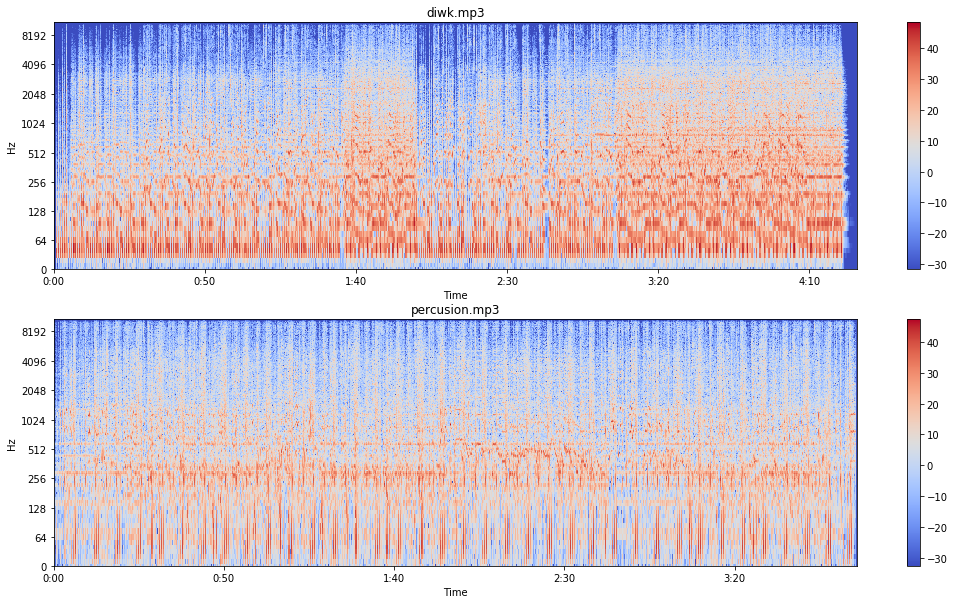

In [6]:
X = [librosa.stft(np[0]) for np in nps]
Xdb = [librosa.amplitude_to_db(abs(stft)) for stft in X] 

plt.figure(figsize=(18, 10))
for i in range(l):
    plt.subplot(f'{l}1{i+1}')
    plt.title(audio_paths[i])
    librosa.display.specshow(Xdb[i], sr=nps[i][1], x_axis='time', y_axis='log')
    plt.colorbar()

## Zero Crossing Rate

The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. This feature has been used heavily in both speech recognition and music information retrieval. It usually has higher values for highly percussive sounds like those in metal and rock.

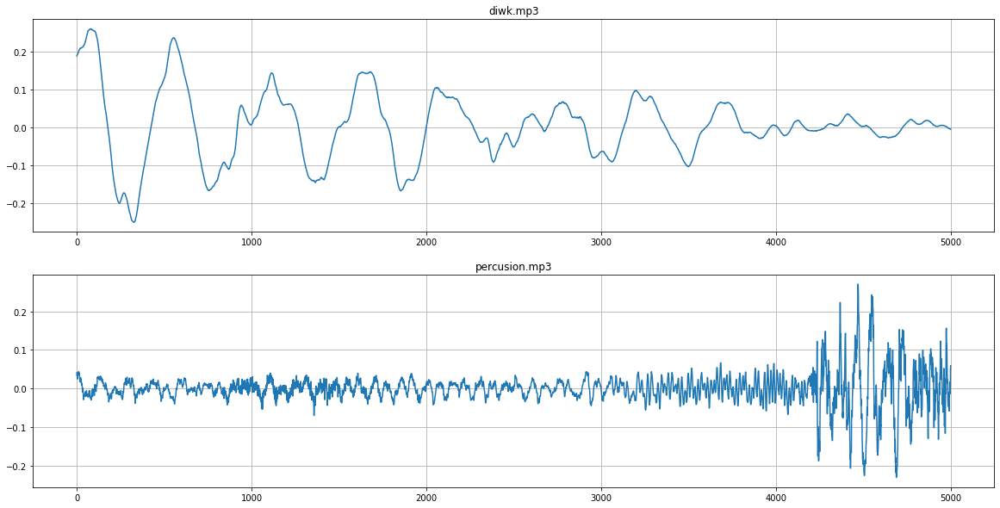

In [13]:
n0, n1 = 25000, 30000
plt.figure(figsize=(20, 10))
for i in range(l):
    plt.subplot(f'{l}1{i+1}')
    plt.title(audio_paths[i])
    plt.plot(nps[i][0][n0:n1])
    plt.grid()

## Spectral centroid

It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. Consider two songs, one from a blues genre and the other belonging to metal. Now as compared to the blues genre song which is the same throughout its length, the metal song has more frequencies towards the end. So spectral centroid for blues song will lie somewhere near the middle of its spectrum while that for a metal song would be towards its end.

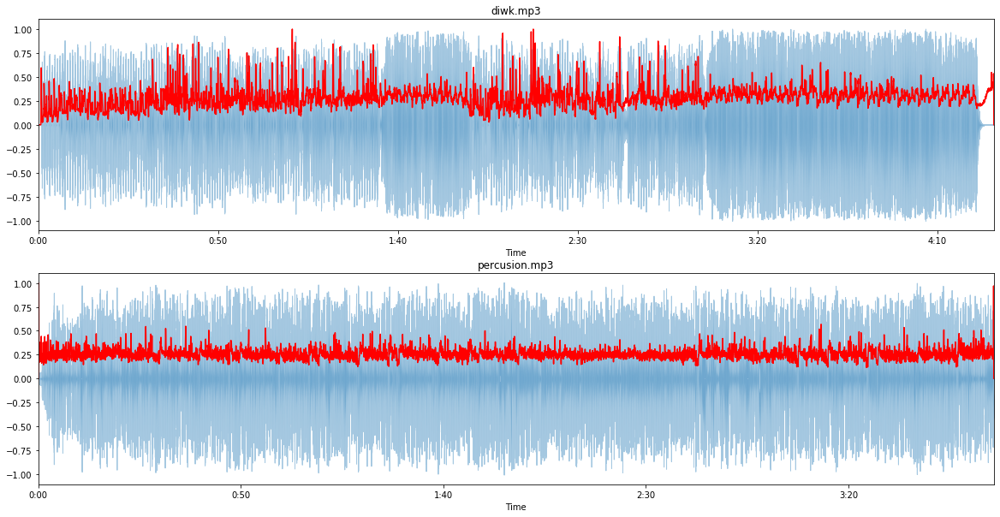

In [18]:
plt.figure(figsize=(20, 10))
for i in range(l):
    x, sr = nps[i]
    spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
    # Computing the time variable for visualization
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    # Normalising the spectral centroid for visualisation
    def normalize(x, axis=0):
        return sklearn.preprocessing.minmax_scale(x, axis=axis)
    #Plotting the Spectral Centroid along the waveform
    plt.subplot(f'{l}1{i+1}')
    librosa.display.waveplot(x, sr=sr, alpha=0.4)
    plt.title(audio_paths[i])
    plt.plot(t, normalize(spectral_centroids), color='r')

## Spectral Rolloff
It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

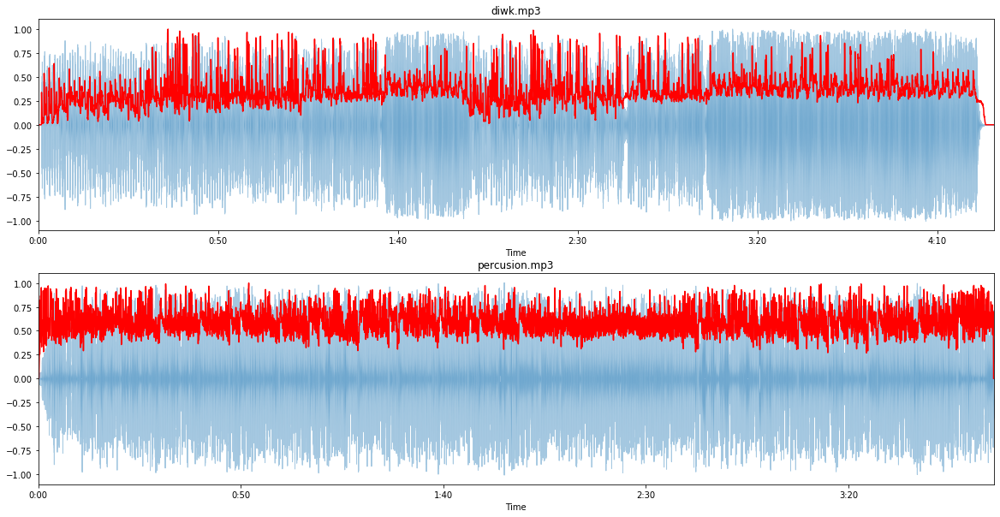

In [21]:
plt.figure(figsize=(20, 10))
for i in range(l):
    x, sr = nps[i]
    spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
    t = librosa.frames_to_time(range(len(spectral_rolloff)))
    plt.subplot(f'{l}1{i+1}')
    plt.title(audio_paths[i])
    librosa.display.waveplot(x, sr=sr, alpha=0.4)
    plt.plot(t, normalize(spectral_rolloff), color='r')

## Mel-Frequency Cepstral Coefficients
The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

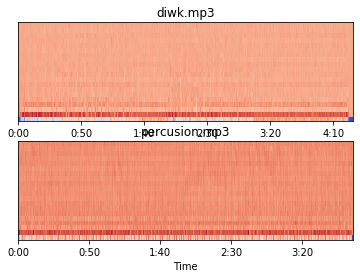

In [37]:
### plt.figure(figsize=(20, 10))
for i in range(l):
    x, sr = nps[i]
    mfccs = librosa.feature.mfcc(x, sr=sr)
    plt.subplot(f'{l}1{i+1}')
    plt.title(audio_paths[i])
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')

## Chroma Frequencies
Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

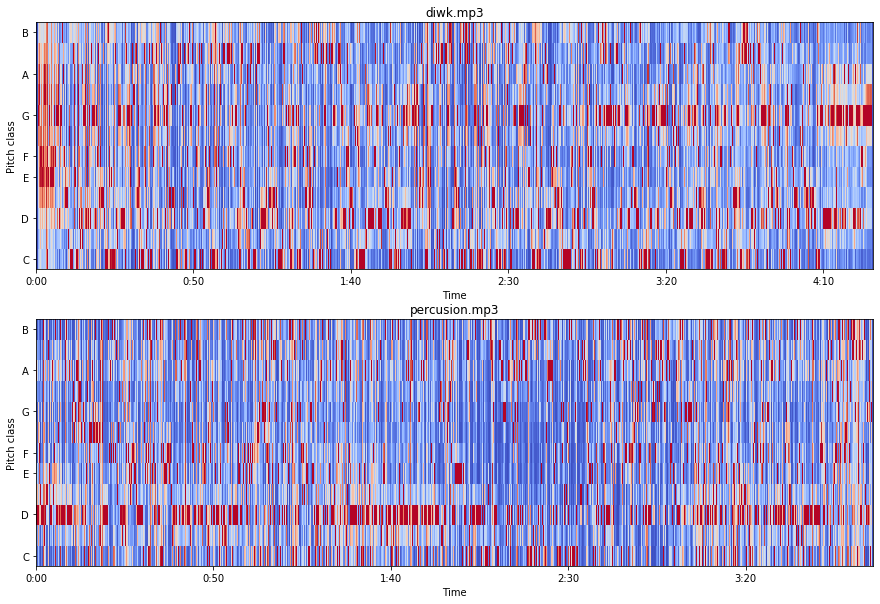

In [52]:
plt.figure(figsize=(15, 10))
for i in range(l):
    x, sr = nps[i]
    hop_length = 512
    plt.subplot(f'{l}1{i+1}')
    plt.title(audio_paths[i])
    chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
    librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')